In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from sklearn.metrics import roc_curve,auc
from sklearn.model_selection import StratifiedKFold

In [4]:
df2 = pd.read_csv('../filtered_data/Dataset2.csv')
df2.dropna()

,Unnamed: 0,hour,dow,month,latitude,longitude,label
0,0,21,6,8,37.786852,-122.401262,1
1,1,22,5,8,37.727457,-122.427302,1
2,2,13,5,8,37.776333,-122.394035,1
3,3,10,5,8,37.718674,-122.443302,1
4,4,16,4,8,37.734823,-122.387382,1
...,...,...,...,...,...,...,...
100431,100431,23,1,7,37.785383,-122.476701,0
100432,100432,18,3,9,37.801169,-122.460813,0
100433,100433,20,4,7,37.761669,-122.473868,0
100434,100434,23,5,2,37.717501,-122.379571,0


In [5]:
len(df2[df2['label'] == 0])/len(df2[df2['label'] == 1])

6.0

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
# import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

In [7]:
def split(data):
    data= data.sample(frac=1)
    X = data.iloc[:,:-1]
    y = data.iloc[:,-1]
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30,random_state=0)
    return (X_train,X_test,y_train,y_test)

In [8]:
df2.drop('Unnamed: 0', axis=1,inplace=True)

In [12]:
df2_X_train, df2_X_test, df2_y_train, df2_y_test = split(df2)

In [13]:
def model(X_train,y_train):
    lr = LogisticRegression(solver='lbfgs')
    nb = GaussianNB()
    dt = DecisionTreeClassifier(max_depth =10)
    rf = RandomForestClassifier(n_estimators =2)
    
    lr.fit(X_train, y_train)
    nb.fit(X_train, y_train)
    dt.fit(X_train, y_train)
    rf.fit(X_train, y_train)
    
    return (lr, nb, dt, rf)

def evaluate(X_test, y_test, model, model_name):
    prob = model.predict_proba(X_test)
    y_pred = prob[:, 1]
    auc = roc_auc_score(y_test, y_pred)
    print(model_name, auc)
    return (y_pred)

def evaluate_no_auc(X_test, y_test, model, model_name):
    pred = model.predict(X_test)
#     auc = roc_auc_score(y_test, y_pred)
#     print(model_name, auc)
    return (pred)

In [14]:
lr_df1, nb_df1, dt_df1, rf_df1 = model(df1_X_train, df1_y_train)
lr_df2, nb_df2, dt_df2, rf_df2 = model(df2_X_train, df2_y_train)

NameError: name 'df1_X_train' is not defined

In [15]:
model_list_1 = [lr_df1, nb_df1, dt_df1, rf_df1]
model_name_1 = ['Logistic Regression-1', 'Naive Bayes-1', 'Decision Tree-1', 'Random Forest-1']

model_list_2 = [lr_df2, nb_df2, dt_df2, rf_df2]
model_name_2 = ['Logistic Regression-2', 'Naive Bayes-2', 'Decision Tree-2', 'Random Forest-2']

NameError: name 'lr_df1' is not defined

In [17]:
validated_df1 = {}
validated_df2 = {}

#Trained on df1 and validated on df1
for model, name in zip(model_list_1, model_name_1):
    validated_df1[name] = evaluate(df1_X_test, df1_y_test, model, name)

Logistic Regression-1 0.5898298606518475
Naive Bayes-1 0.6360270793534243
Decision Tree-1 0.7686820157262816
Random Forest-1 0.8791425420899441


In [18]:
#Trained on df2 and validated on df1
for model, name in zip(model_list_2, model_name_2):
    validated_df1[name] = evaluate(df1_X_test, df1_y_test, model, name)

Logistic Regression-2 0.578829456683317
Naive Bayes-2 0.59626025867084
Decision Tree-2 0.6498744168358545
Random Forest-2 0.6789319975625311


In [19]:
#Trained on df2 and validated on df2
for model, name in zip(model_list_2, model_name_2):
    validated_df2[name] = evaluate(df2_X_test, df2_y_test, model, name)

Logistic Regression-2 0.6620097737131304
Naive Bayes-2 0.7085330807356283
Decision Tree-2 0.7711165370826631
Random Forest-2 0.6454718800711938


In [20]:
#Trained on df1 and validated on df2
for model, name in zip(model_list_1, model_name_1):
    validated_df2[name] = evaluate(df2_X_test, df2_y_test, model, name)

Logistic Regression-1 0.6183421103827169
Naive Bayes-1 0.6902817174896755
Decision Tree-1 0.6211773284090587
Random Forest-1 0.5956792706800244


In [21]:
df1_test_positive = df1_X_test.loc[df1_y_test == 1, :]
df2_test_positive = df2_X_test.loc[df2_y_test == 1, :]

In [22]:
validated_df1_positve = {}
validated_df2_positve = {}

In [23]:
#Trained on df1 and validated on df1_positive
for model, name in zip(model_list_1, model_name_1):
    validated_df1_positve[name] = evaluate_no_auc(df1_test_positive, [1]*len(df1_test_positive), model, name)

In [89]:
#Trained on df2 and validated on df1_positive
for model, name in zip(model_list_2, model_name_2):
    validated_df1_positve[name] = evaluate_no_auc(df1_test_positive, [1]*len(df1_test_positive), model, name)

In [90]:
#Trained on df2 and validated on df2_positive
for model, name in zip(model_list_2, model_name_2):
    validated_df2_positve[name] = evaluate_no_auc(df2_test_positive, [1]*len(df2_test_positive), model, name)

In [91]:
#Trained on df1 and validated on df2_positive
for model, name in zip(model_list_1, model_name_1):
    validated_df2_positve[name] = evaluate_no_auc(df2_test_positive, [1]*len(df2_test_positive), model, name)

In [92]:
def plot_roc(y_test, validated, title):
    
    ns_probs = [0 for _ in range(len(y_test))]
    ns_fpr, ns_tpr, _ =  roc_curve(y_test, ns_probs)
    
    fig = plt.figure(figsize=(6,6), dpi=100)
    plt.plot(ns_fpr, ns_tpr, linestyle='--', label='Default')

    for model in validated:
        fpr, tpr, _ = roc_curve(y_test, validated[model])
        plt.plot(fpr, tpr, label= model)
    
    plt.title(title)
    # axis labels
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    # show the legend
    plt.legend()
    # show the plot
    plt.show()

In [93]:
validated_df1

{'Logistic Regression-1': array([0.18965449, 0.13819064, 0.10416377, ..., 0.09792777, 0.12072482,
        0.19853861]),
 'Naive Bayes-1': array([0.21798242, 0.17079079, 0.14074307, ..., 0.10598192, 0.09215831,
        0.19204216]),
 'Decision Tree-1': array([0.06606013, 0.02325581, 0.11303861, ..., 0.18293471, 0.12426036,
        0.18685121]),
 'Random Forest-1': array([1. , 0. , 0.5, ..., 0.5, 0. , 0. ]),
 'Logistic Regression-2': array([0.30244409, 0.17665417, 0.12994311, ..., 0.10664758, 0.16522672,
        0.34022619]),
 'Naive Bayes-2': array([0.36742151, 0.24850694, 0.17117821, ..., 0.10567845, 0.17119395,
        0.38871632]),
 'Decision Tree-2': array([0.1986532 , 0.28450106, 0.32107023, ..., 0.32107023, 0.28450106,
        0.1986532 ]),
 'Random Forest-2': array([0. , 0. , 0. , ..., 1. , 0.5, 0. ])}

In [94]:
# del validated_df1['Random Forest-1']
# del validated_df1['Random Forest-2']
# del validated_df2['Random Forest-1']
# del validated_df2['Random Forest-2']

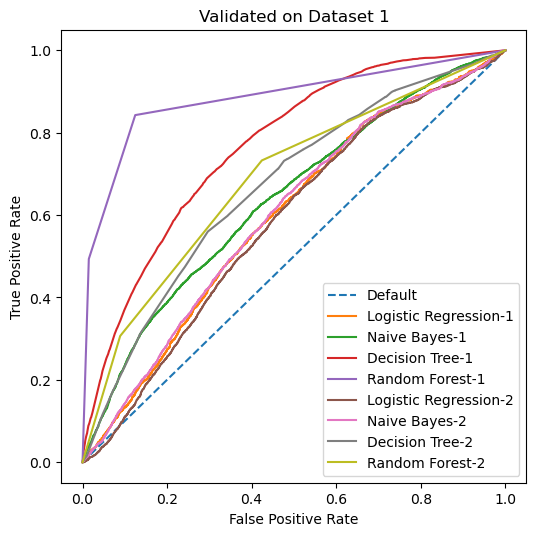

In [95]:
plot_roc(df1_y_test, validated_df1, 'Validated on Dataset 1')

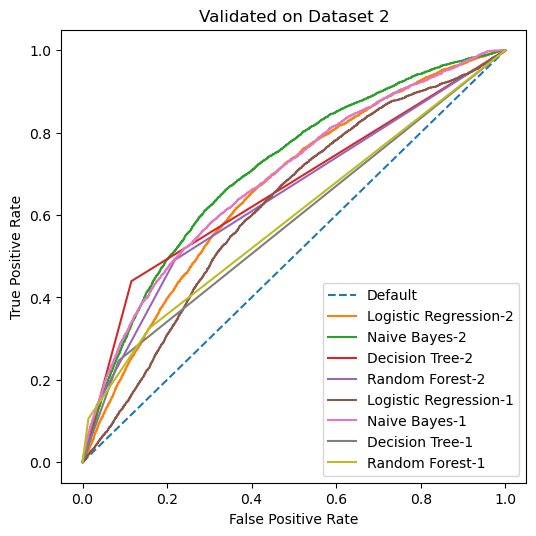

In [78]:
plot_roc(df2_y_test, validated_df2, 'Validated on Dataset 2')

In [96]:
def compute_accuracy(validated_positive):
    for model in validated_positive:
        print(model+": "+ (str)(np.sum(validated_positive[model] == 1)/len(validated_positive[model])))

In [97]:
compute_accuracy(validated_df1_positve)

Logistic Regression-1: 0.0
Naive Bayes-1: 0.0
Decision Tree-1: 0.06929837199250828
Random Forest-1: 0.4933006771358594
Logistic Regression-2: 0.0
Naive Bayes-2: 0.0
Decision Tree-2: 0.1348508860394756
Random Forest-2: 0.30629592277769774


In [98]:
compute_accuracy(validated_df2_positve)

Logistic Regression-2: 0.0
Naive Bayes-2: 0.0
Decision Tree-2: 0.08261976394353159
Random Forest-2: 0.1342281879194631
Logistic Regression-1: 0.0
Naive Bayes-1: 0.0
Decision Tree-1: 0.02568849803286276
Random Forest-1: 0.1254339273316362


In [18]:
## Cross validation
from sklearn.naive_bayes import BernoulliNB
cv = StratifiedKFold(n_splits=10,shuffle=False)

def model_cv(x, y):
    lr = LogisticRegression(class_weight='balanced')
    nb = GaussianNB()
    dt = DecisionTreeClassifier(class_weight='balanced', random_state=42, min_samples_leaf=2, max_depth=38, min_samples_split=4, min_impurity_decrease=0.0000001)
    rf = RandomForestClassifier(class_weight='balanced', n_estimators =150, random_state=42, min_samples_leaf=2, max_depth=38, min_samples_split=4, min_impurity_decrease=0.0000001)
    
    model_list = [lr, nb, dt, rf]
    model_name = ['Logistic Regression', 'Naive Bayes', 'Decision Tree', 'Random Forest']
    validation = {}
    
    
    for idx,model in enumerate(model_list):
        print(model_name[idx])
#         if model_name[idx] != 'Random Forest':
#             continue
        if model_name[idx] not in validation:
            validation[model_name[idx]] = {
                'fpr' :[],
                'tpr':[],
                'pred':[],
                'y_test':[]
            }
        clf = model
        
        if idx==2:
            sub = [3, 4]
        elif idx==3:
            sub = [3, 4]
        elif idx==0:
            sub = [4]
        else:
            sub = list(range(5))
        
        ## appending tpr and fpr for each model
        for train,test in cv.split(x,y):
            prediction = clf.fit(x.iloc[train,sub],y.iloc[train]).predict_proba(x.iloc[test,sub])
            validation[model_name[idx]]['pred'].extend(list(prediction[:, 1]))
            validation[model_name[idx]]['y_test'].extend(list(y[test]))
        fpr, tpr, t = roc_curve(validation[model_name[idx]]['y_test'], validation[model_name[idx]]['pred'])
        validation[model_name[idx]]['fpr'].extend(fpr)
        validation[model_name[idx]]['tpr'].extend(tpr)
        validation[model_name[idx]]['thresh'] = t
        validation[model_name[idx]]['auc'] = roc_auc_score(validation[model_name[idx]]['y_test'], validation[model_name[idx]]['pred'])        
            
    ## returns a dict containing fpr and tpr for 4 models.
    return validation

In [19]:
x2 = df2.iloc[:, :-1]
y2 = df2.iloc[:, -1]
validation_dataset2 = model_cv(x2, y2)

Logistic Regression
Naive Bayes
Decision Tree
Random Forest


In [20]:
# tpr >= 0.8
# pos = validation_dataset2['Logistic Regression']['y_test'].count(1)
# neg = validation_dataset2['Logistic Regression']['y_test'].count(0)
for model in validation_dataset2:
    t = np.array(validation_dataset2[model]['tpr'])
    thresh = validation_dataset2[model]['thresh'][t[t<0.8].shape[0]]
    fpr = validation_dataset2[model]['fpr'][t[t<0.8].shape[0]]
    tpr = validation_dataset2[model]['tpr'][t[t<0.8].shape[0]]
    precision = (tpr*pos)/(tpr*pos + fpr*neg)
    f1 = (1.8*precision)/(precision+0.8)
    print(model, thresh, tpr, 1-fpr, precision, (tpr*pos + (1-fpr)*neg)/(pos+neg))

NameError: name 'pos' is not defined

In [445]:
dt1 = DecisionTreeClassifier(class_weight='balanced', min_samples_leaf=2, max_depth=38, min_samples_split=4, min_impurity_decrease=0.0000001)
# sub = list(range(5))
sub = [3, 4]
res = {'pred':[], 'y_test':[]}
cv = StratifiedKFold(n_splits=5,shuffle=True)
for train,test in cv.split(x2,y2):
    prediction = dt1.fit(x2.iloc[train,sub],y2.iloc[train]).predict_proba(x2.iloc[test,sub])
    res['pred'].extend(list(prediction[:, 1]))
    res['y_test'].extend(list(y2[test]))
fpr, tpr, t = roc_curve(res['y_test'], res['pred'])
auc = roc_auc_score(res['y_test'], res['pred'])        
print(auc)

0.910783928521789


In [266]:
x2.columns.values

array(['hour', 'dow', 'month', 'latitude', 'longitude'], dtype=object)

In [153]:
pd.Series(dt1.predict_proba(x2.iloc[:, sub])[:, 1]).value_counts()

0.000000    83989
1.000000    11569
0.857135     1995
0.923072      760
0.749988      547
0.947365      434
0.959998      293
0.967740      250
0.979591      100
0.972971       83
0.976743       64
0.983606       55
0.981817       54
0.990291       40
0.994285       33
0.899994       27
0.985074       27
0.992125       25
0.937496       22
0.991304       21
0.988235       18
0.974998       16
0.986300       14
dtype: int64

In [356]:
regions = dict()
tree = dt1.tree_

def find_regions(node, lat_min, lat_max, lon_min, lon_max):
    if tree.children_left[node]==-1 and tree.children_right[node]==-1:
        if lat_min!=lat_max and lon_min!=lon_max:
            regions[(lat_min,lon_min), (lat_max, lon_min), (lat_max,lon_max), (lat_min, lon_max)] = tree.value[node][0]
        return
    if tree.children_left[node]!=-1:
        if tree.feature[node]==0:
            new_lat_max = min(lat_max, tree.threshold[node])
            find_regions(tree.children_left[node], lat_min, new_lat_max, lon_min, lon_max)
        elif tree.feature[node]==1:
            new_lon_max = min(lon_max, tree.threshold[node])
            find_regions(tree.children_left[node], lat_min, lat_max, lon_min, new_lon_max)
    if tree.children_right[node]!=-1:
        if tree.feature[node]==0:
            new_lat_min = max(lat_min, tree.threshold[node])
            find_regions(tree.children_right[node], new_lat_min, lat_max, lon_min, lon_max)
        elif tree.feature[node]==1:
            new_lon_min = max(lon_min, tree.threshold[node])
            find_regions(tree.children_right[node], lat_min, lat_max, new_lon_min, lon_max)

In [357]:
find_regions(0, 37.7077, 37.812, -122.515389, -122.355)

In [437]:
# dt1 = DecisionTreeClassifier(class_weight='balanced', random_state=42, min_samples_leaf=10)
dt1.fit(x2.iloc[:, [3,4]], y2)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=38, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=1e-07, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=4,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [439]:
folium_map

In [438]:
import folium

folium_map = folium.Map(location=(37.76, -122.44), zoom_start=11, max_zoom=100)
                        
for rect in regions:
    label = np.argmax(regions[rect])
    if label==0:
        param = 'green', 0.2#regions[rect][label]/86088
    else:
        param = 'red', 0.5#regions[rect][label]/14348
    folium.vector_layers.Polygon(list(rect), color=param[0], weight=1,fill_color=param[0], fill_opacity=param[1]).add_to(folium_map)

for i, row in x2[y2==1].iterrows():
    folium.vector_layers.Circle((row['latitude'], row['longitude']), radius=10, color='black', fill_color='yellow', weight=1, fill_opacity=1).add_to(folium_map)

In [254]:
dt1.tree_.children_left[2], dt1.tree_.children_right[15820], dt1.tree_.feature[1], dt1.tree_.value[0], dt1.tree_.max_n_classes

(3, -1, 0, array([[40174.50000002, 40174.5       ]]), 2)

In [46]:
text_representation = pt.export_text(dt)
print(text_representation)

|--- feature_2 <= -122.45
|   |--- feature_0 <= 14.50
|   |   |--- feature_0 <= 6.50
|   |   |   |--- feature_0 <= 1.50
|   |   |   |   |--- feature_1 <= 37.79
|   |   |   |   |   |--- feature_1 <= 37.78
|   |   |   |   |   |   |--- feature_2 <= -122.48
|   |   |   |   |   |   |   |--- feature_1 <= 37.75
|   |   |   |   |   |   |   |   |--- feature_2 <= -122.48
|   |   |   |   |   |   |   |   |   |--- feature_1 <= 37.74
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- feature_1 >  37.74
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- feature_2 >  -122.48
|   |   |   |   |   |   |   |   |   |--- feature_2 <= -122.48
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- feature_2 >  -122.48
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- feature_1 >  37.75
|   |   |   |   |   |   |   |   |--- feature_1 <= 37.76
|   |   | 

In [119]:
dt1.feature_importances_

array([0.18407279, 0.00254651, 0.01173397, 0.30236225, 0.49928449])

In [61]:
def plot_roc_cv(validation):
    
#     ns_probs = [0 for _ in range(len(df1))]
#     ns_fpr, ns_tpr, _ =  roc_curve(y_test, ns_probs)
    
#     fig = plt.figure(figsize=(6,6), dpi=100)

    for model in validation:
        print(model)
        fpr = validation[model]['fpr']
        tpr = validation[model]['tpr']
        print(len(fpr),len(tpr))
        plt.plot(fpr, tpr, label= model,lw=1.3)
    
    plt.plot([0, 1], [0, 1], linestyle='--',lw=1.3)
    plt.title('Cross Validation ROC')
    # axis labels
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    # show the legend
    plt.legend(loc='lower right')
    # show the plot
    plt.show()

In [63]:
for model in validation_dataset2:
    print(model, validation_dataset2[model]['auc'])

Logistic Regression 0.6230131423018315
Naive Bayes 0.6760167392591866
Decision Tree 0.9164814142889737
Random Forest 0.9472246414979264


Logistic Regression
23440 23440
Naive Bayes
22916 22916
Decision Tree
1747 1747
Random Forest
29166 29166


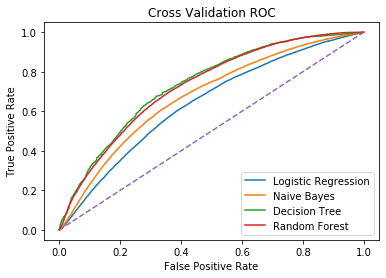

In [31]:
plot_roc_cv(validation_dataset2) # only using lat long

Logistic Regression
19505 19505
Naive Bayes
22916 22916
Decision Tree
306 306
Random Forest
10939 10939


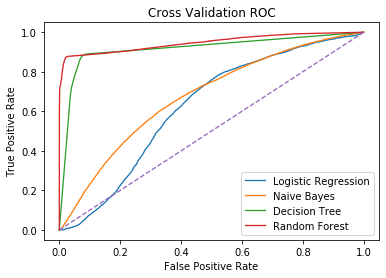

In [62]:
plot_roc_cv(validation_dataset2)  # all features

In [11]:
def scorer(estimator, X, y):
    y_pred = estimator.predict_proba(X)[:, 1]
    fpr, tpr, t = roc_curve(y, y_pred)
    tnr = 1 - fpr[tpr[tpr<0.8].shape[0]]
    return tnr

In [ ]:
x2.columns.values

In [90]:
nb_all = GaussianNB().fit(df2_X_train, df2_y_train)
scorer(nb_all,df2_X_test, df2_y_test)

0.46714025076666277

In [91]:
idx = [0, 1, 2, 3, 4]
for i in idx:
    X_train = df2_X_train.iloc[:, list(range(i))+list(range(i+1, len(idx)))]
    X_test = df2_X_test.iloc[:, list(range(i))+list(range(i+1, len(idx)))]
    nb = GaussianNB().fit(X_train, df2_y_train)
    print(x2.columns.values[i], scorer(nb, X_test, df2_y_test))

hour 0.44590660300454177
dow 0.4669461589224021
month 0.4601529443732775
latitude 0.46550987927487286
longitude 0.413454446644152


In [18]:
from sklearn.feature_selection import RFECV

# rfe_lr = RFECV(LogisticRegression(class_weight='balanced'), scoring=scorer).fit(x2, y2)
# rfe_nb = RFECV(GaussianNB(), scoring=scorer).fit(x2, y2)
# rfe_dt = RFECV(DecisionTreeClassifier(class_weight='balanced', min_impurity_decrease=0.00009, random_state=42), scoring=scorer).fit(x2, y2)
# rfe_rf = RFECV(RandomForestClassifier(class_weight='balanced', n_estimators=100, max_depth=10, random_state=42), scoring=scorer).fit(x2, y2)
# rfe_dt = RFECV(DecisionTreeClassifier(class_weight='balanced', random_state=42), scoring=scorer).fit(x2, y2)
rfe_rf = RFECV(RandomForestClassifier(class_weight='balanced', n_estimators=10, random_state=42), scoring=scorer).fit(x2, y2)

In [21]:
x2.columns.values

array(['hour', 'dow', 'month', 'latitude', 'longitude'], dtype=object)

In [19]:
for rfe in [rfe_lr, rfe_dt, rfe_rf]:
    print(rfe.ranking_, rfe.support_)

[3 5 4 2 1] [False False False False  True]
[2 4 3 1 1] [False False False  True  True]
[2 4 3 1 1] [False False False  True  True]


In [117]:
rfe.support_   # means latitude and longitude

array([False, False, False,  True,  True])

In [119]:
rfe1 = RFECV(DecisionTreeClassifier(max_depth=10)).fit(x1, y1)

In [120]:
rfe1.ranking_

array([1, 1, 1, 1, 1])

In [64]:
import math
def plot_log_roc_cv(validation):
    for model in validation:
        print(model)
        tnr = [1-x for x in validation[model]['fpr']]
        fnr = [math.log10(1-x+1e-10) for x in validation[model]['tpr']]
        print(len(fnr),len(tnr))
        plt.plot(fnr, tnr, label= model, lw=1.3, alpha=0.8, ls='-')
    
    plt.title('Log transform CV ROC')
    # axis labels
    plt.xlabel('False Negative Rate')
    plt.xticks(range(-10, 1,  2), [math.pow(10, e)for e in range(-10, 1, 2)])
    plt.ylabel('True Negative Rate')
    # show the legend
    plt.legend()
    # show the plot

    plt.show()

Logistic Regression
19505 19505
Naive Bayes
22916 22916
Decision Tree
306 306
Random Forest
10939 10939


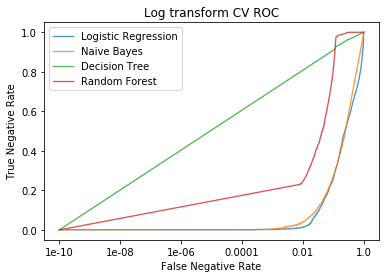

In [65]:
plot_log_roc_cv(validation_dataset2)

In [22]:
x2.head()

,hour,dow,month,latitude,longitude
0,21,6,8,37.786852,-122.401262
1,22,5,8,37.727457,-122.427302
2,13,5,8,37.776333,-122.394035
3,10,5,8,37.718674,-122.443302
4,16,4,8,37.734823,-122.387382


In [23]:
rf = RandomForestClassifier(class_weight='balanced', n_estimators =100, random_state=42).fit(x2.iloc[:,[3,4]],y2.iloc[:])

In [24]:
# y_pred = rf.predict_proba(x2.iloc[:, [3,4]])
# roc_auc_score(y2.iloc[:], y_pred[:, 1])
import pickle

with open('rf.pkl', 'wb') as f:
    pickle.dump(rf, f)